In [1]:
#importing important modules
using ScikitLearn
@sk_import model_selection: train_test_split
ENV["COLUMNS"] = 1000
using Pandas
using Seaborn
#import Pkg; Pkg.add("Seaborn")

┌ Warning: Module model_selection has been ported to Julia - try `import ScikitLearn: CrossValidation` instead
└ @ ScikitLearn.Skcore C:\Users\harsh\.julia\packages\ScikitLearn\Kn82b\src\Skcore.jl:169


In [2]:
#loading the cancer dataset
df = read_csv("C:\\Users\\harsh\\Desktop\\Julia\\data.csv")
head(df) # first five rows of the dataset

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
df = drop(df,columns = "Unnamed: 32" ); # dropping the useless column

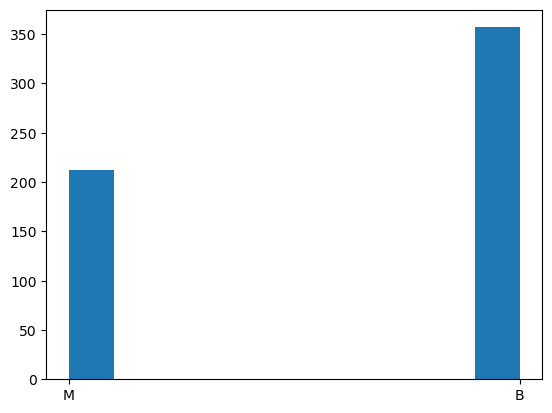

([212.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 357.0], [0.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6000000000000001, 0.7000000000000001, 0.8, 0.9, 1.0], (PyObject <matplotlib.patches.Rectangle object at 0x0000000061C06F10>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C06BB0>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C76460>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C76730>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C76A00>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C76CD0>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C76FA0>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C862B0>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C86580>, PyObject <matplotlib.patches.Rectangle object at 0x0000000061C86850>))

In [4]:
Seaborn.hist(df.diagnosis) #histogram

In [5]:
Seaborn.pairplot(df)# really powerful tool to see relations between columns

PyObject <seaborn.axisgrid.PairGrid object at 0x0000000081DD20D0>

In [4]:
df1= get_dummies(df,columns = ["diagnosis"], dtype = "int"); # one hot encoding the diagnosis column

In [5]:
corr_mat = corr(df1)["diagnosis_M"]; # correlational data of the provided features

In [6]:
print(corr_mat) #printing the outcome of the correlational function 

id                         0.039769
radius_mean                0.730029
texture_mean               0.415185
perimeter_mean             0.742636
area_mean                  0.708984
smoothness_mean            0.358560
compactness_mean           0.596534
concavity_mean             0.696360
concave points_mean        0.776614
symmetry_mean              0.330499
fractal_dimension_mean    -0.012838
radius_se                  0.567134
texture_se                -0.008303
perimeter_se               0.556141
area_se                    0.548236
smoothness_se             -0.067016
compactness_se             0.292999
concavity_se               0.253730
concave points_se          0.408042
symmetry_se               -0.006522
fractal_dimension_se       0.077972
radius_worst               0.776454
texture_worst              0.456903
perimeter_worst            0.782914
area_worst                 0.733825
smoothness_worst           0.421465
compactness_worst          0.590998
concavity_worst            0

# Important/highly related columns that could be considered as features
>radius_mean                0.730029

>perimeter_mean             0.742636

>area_mean                  0.708984

>concavity_mean             0.696360

>concave points_mean        0.776614

>radius_worst               0.776454

>perimeter_worst            0.782914

>area_worst                 0.733825

>concavity_worst            0.659610

>concave points_worst       0.793566

In [7]:
df2 = df1[["concave points_worst","radius_mean","perimeter_mean","area_mean","concavity_mean","concave points_mean","radius_worst","perimeter_worst","area_worst","concavity_worst", "diagnosis_M", "diagnosis_B"]];
#choosing top features

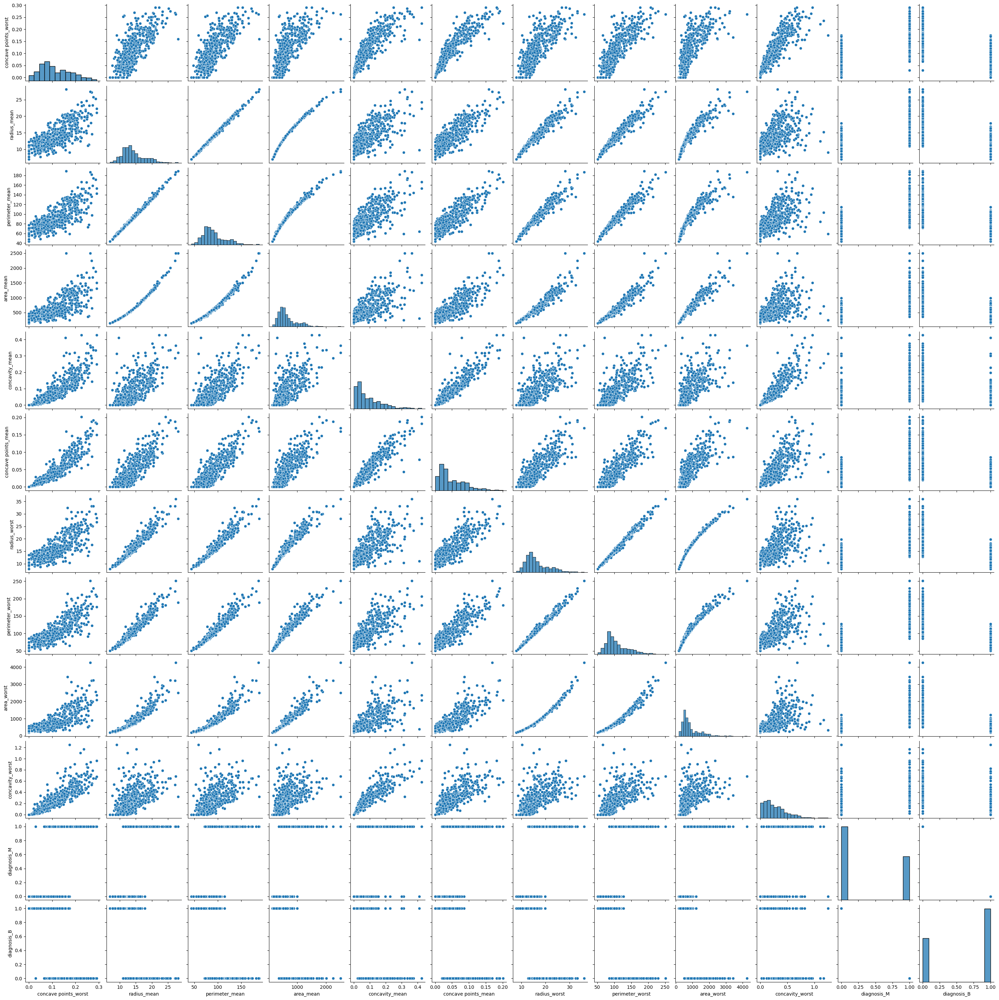

PyObject <seaborn.axisgrid.PairGrid object at 0x000000000DB0B6A0>

In [76]:
Seaborn.pairplot(df2) #plotting feature vs feature graph

In [8]:
df2 = drop(df2, ["diagnosis_B"], axis = 1);
x = Array(drop(df2, ["diagnosis_M"], axis=1));
y = Array(df2["diagnosis_M"]);

In [9]:
xtrain, xtest, ytrain,ytest= train_test_split(x,y,train_size=0.8); 

In [10]:
#importing four main classifiers available in sklearn
@sk_import tree: DecisionTreeClassifier;
@sk_import ensemble: RandomForestClassifier;
@sk_import svm: SVC;
@sk_import ensemble: AdaBoostClassifier;
@sk_import metrics: classification_report;

## Random Forests

In [11]:
model1 = RandomForestClassifier().fit(xtrain, ytrain);
predicts1 = model1.predict(xtest);

In [12]:
Rand_report = classification_report(ytest, predicts1); #creating a classification report

In [13]:
print(Rand_report)

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        75
           1       1.00      0.95      0.97        39

    accuracy                           0.98       114
   macro avg       0.99      0.97      0.98       114
weighted avg       0.98      0.98      0.98       114


## Decision Tree

In [14]:
model2 = DecisionTreeClassifier().fit(xtrain, ytrain);
predicts2 = model2.predict(xtest);

In [15]:
DTC_report = classification_report(ytest,predicts2)
print(DTC_report)

              precision    recall  f1-score   support

           0       0.97      0.97      0.97        75
           1       0.95      0.95      0.95        39

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114


## SVM

In [16]:
model3 = SVC().fit(xtrain,ytrain);
predicts3 = model3.predict(xtest);

In [17]:
SVM_report = classification_report(ytest,predicts3)
print(SVM_report)

              precision    recall  f1-score   support

           0       0.93      1.00      0.96        75
           1       1.00      0.85      0.92        39

    accuracy                           0.95       114
   macro avg       0.96      0.92      0.94       114
weighted avg       0.95      0.95      0.95       114


## Ada Boost

In [18]:
model4 = AdaBoostClassifier().fit(xtrain,ytrain);
predicts4 = model4.predict(xtest);


In [19]:
ADA_report = classification_report(ytest,predicts4);
print(ADA_report)

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        75
           1       1.00      0.95      0.97        39

    accuracy                           0.98       114
   macro avg       0.99      0.97      0.98       114
weighted avg       0.98      0.98      0.98       114


In [20]:
@sk_import metrics: accuracy_score; # important accuracy score from sklearn.metrics

In [21]:
algos = ["Random Forest", "Descision Tree", "SVM", "Ada Boost"];
acc = [accuracy_score(ytest,predicts1),accuracy_score(ytest,predicts2),accuracy_score(ytest,predicts3),accuracy_score(ytest,predicts4)];
#creating columns foe making a plot, could not create dataframe due to oblivious error

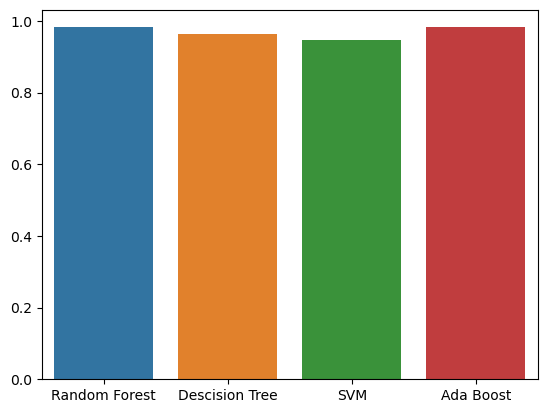

C:\Users\harsh\.julia\conda\3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


PyObject <AxesSubplot:>

In [22]:
Seaborn.barplot(algos,acc)
#algorithms vs accuracy scores

# Conclusion - 1
>### Ada boost performs the best at 98 - 96% at a train set of 80% against a test sset of 20%
>### Second to Ada boost Random forest performs the 2nd best with 98 -95% at a train set of 80% against a test set of 20%
>### Random forest performs the best with 95% score at a train set of 60% against a test set of 40%

# Appendix - 1
>### When a training dataset of more than 60% of the original dataset was used, none of the model could reach 95+ % of acccuracy at shuffle = true

In [23]:
#training on all columns instead of the highly related ones
df1 = drop(df1, ["diagnosis_B"], axis = 1)#dummy trap
x = Array(drop(df1, ["id","diagnosis_M"], axis=1)); #dropping id because it can highly manipulate the result 
y = Array(df1["diagnosis_M"]);

In [53]:
xtrain, xtest, ytrain,ytest= train_test_split(x,y,train_size=0.65); 

In [54]:
model1 = RandomForestClassifier().fit(xtrain, ytrain);
predicts1 = model1.predict(xtest);
Rand_report = classification_report(ytest, predicts1); #creating a classification report
print(Rand_report)

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       113
           1       0.96      0.93      0.95        87

    accuracy                           0.95       200
   macro avg       0.96      0.95      0.95       200
weighted avg       0.96      0.95      0.95       200


In [55]:
model2 = DecisionTreeClassifier().fit(xtrain, ytrain);
predicts2 = model2.predict(xtest);
DTC_report = classification_report(ytest,predicts2)
print(DTC_report)

              precision    recall  f1-score   support

           0       0.92      0.95      0.93       113
           1       0.93      0.90      0.91        87

    accuracy                           0.93       200
   macro avg       0.93      0.92      0.92       200
weighted avg       0.93      0.93      0.92       200


In [56]:
model3 = SVC().fit(xtrain,ytrain);
predicts3 = model3.predict(xtest);
SVM_report = classification_report(ytest,predicts3)
print(SVM_report)

              precision    recall  f1-score   support

           0       0.85      0.99      0.91       113
           1       0.99      0.77      0.86        87

    accuracy                           0.90       200
   macro avg       0.92      0.88      0.89       200
weighted avg       0.91      0.90      0.89       200


In [57]:
model4 = AdaBoostClassifier().fit(xtrain,ytrain);
predicts4 = model4.predict(xtest);
ADA_report = classification_report(ytest,predicts4);
print(ADA_report)

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       113
           1       1.00      0.94      0.97        87

    accuracy                           0.97       200
   macro avg       0.98      0.97      0.97       200
weighted avg       0.98      0.97      0.97       200


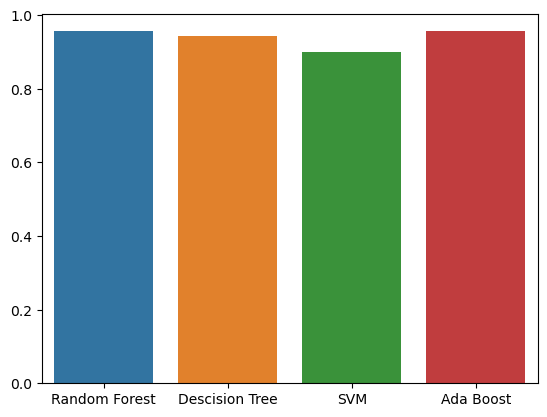

C:\Users\harsh\.julia\conda\3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


PyObject <AxesSubplot:>

In [52]:
algos = ["Random Forest", "Descision Tree", "SVM", "Ada Boost"];
acc = [accuracy_score(ytest,predicts1),accuracy_score(ytest,predicts2),accuracy_score(ytest,predicts3),accuracy_score(ytest,predicts4)];
Seaborn.barplot(algos,acc)

# Conclusion - 2
>## When all the columns were used as feature, at 60% train set:
>### Ada boost performs the best at 98-97% accuracy
>### Random forest is the runner up at 97-95% accuracy